<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Подготовка данных</a></span><ul class="toc-item"><li><span><a href="#Проверка-рассчета-эффективности-обогащения" data-toc-modified-id="Проверка-рассчета-эффективности-обогащения-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Проверка рассчета эффективности обогащения</a></span></li><li><span><a href="#Признаки,-недоступные-в-тестовой-выборке." data-toc-modified-id="Признаки,-недоступные-в-тестовой-выборке.-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Признаки, недоступные в тестовой выборке.</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Предобработка данных</a></span></li></ul></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Модель" data-toc-modified-id="Модель-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Модель</a></span><ul class="toc-item"><li><span><a href="#Финальная-модель" data-toc-modified-id="Финальная-модель-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Финальная модель</a></span></li></ul></li><li><span><a href="#Вывод" data-toc-modified-id="Вывод-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Вывод</a></span></li></ul></div>

# Восстановление золота из руды

Подготовьте прототип модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. Используйте данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Вам нужно:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.

Чтобы выполнить проект, обращайтесь к библиотекам *pandas*, *matplotlib* и *sklearn.* Вам поможет их документация.

**Описание данных**

*Технологический процесс*
- Rougher feed — исходное сырье
- Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
- Xanthate **— ксантогенат (промотер, или активатор флотации);
- Sulphate — сульфат (на данном производстве сульфид натрия);
- Depressant — депрессант (силикат натрия).
- Rougher process (англ. «грубый процесс») — флотация
- Rougher tails — отвальные хвосты
- Float banks — флотационная установка
- Cleaner process — очистка
- Rougher Au — черновой концентрат золота
- Final Au — финальный концентрат золота

*Параметры этапов*
- air amount — объём воздуха
- fluid levels — уровень жидкости
- feed size — размер гранул сырья
- feed rate — скорость подачи

*Наименование признаков*
Наименование признаков должно быть такое:
- [этап].[тип_параметра].[название_параметра]
Пример: rougher.input.feed_ag

*Возможные значения для блока [этап]:*
- rougher — флотация
- primary_cleaner — первичная очистка
- secondary_cleaner — вторичная очистка
- final — финальные характеристики

*Возможные значения для блока [тип_параметра]:*
- input — параметры сырья
- output — параметры продукта
- state — параметры, характеризующие текущее состояние этапа
- calculation — расчётные характеристики


## Подготовка данных

In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import ydata_profiling
from ydata_profiling import ProfileReport
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import time
import scipy.stats as st
sns.set(style='darkgrid', font_scale=1.4)

In [3]:
try:
    data_train = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_train_new.csv')
    data_test = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_test_new.csv')
    data_full = pd.read_csv('https://code.s3.yandex.net/datasets/gold_recovery_full_new.csv')
except:
    data_full = pd.read_csv('datasets/gold_recovery_full_new.csv')    
    data_test = pd.read_csv('datasets/gold_recovery_test_new.csv')
    data_train = pd.read_csv('datasets/gold_recovery_train_new.csv')

In [4]:
data_train.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


In [5]:
data_test.head()

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
4,2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333


In [6]:
data_full.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


In [7]:
data_train.profile_report(minimal=True, progress_bar=False)

In [8]:
data_test.profile_report(minimal=True, progress_bar=False)

In [9]:
data_full.profile_report(minimal=True, progress_bar=False)

В обучающей выборке в некоторых колнках имеюются выбросы и пустые значения, обработаем их позже.

### Проверка рассчета эффективности обогащения

In [10]:
C = data_train['rougher.output.concentrate_au']
F = data_train['rougher.input.feed_au']
T = data_train['rougher.output.tail_au']

In [11]:
data_train['rougher.output.recovery_chek'] = ((C*(F-T))/(F*(C-T)))*100
data_train['rougher.output.recovery_chek'].mean()

82.70450164550293

In [12]:
data_train['rougher.output.recovery'].mean()

82.70450164550293

In [13]:
print(mean_absolute_error(data_train['rougher.output.recovery_chek'], data_train['rougher.output.recovery']))

9.73512347450521e-15


Средние значения совпадают, значение ошибки незначительное. Эффективности обогащения рассчитана правильно.

In [14]:
data_train.drop('rougher.output.recovery_chek', axis=1, inplace=True)

### Признаки, недоступные в тестовой выборке.

In [15]:
sorted(list(set(data_train.columns) - set(data_test.columns)))

['final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.ta

В тестовой выборке отсутствуют признаки, относящиеся к параметрам продутка. Так же рассчетные характеристики некоторых параметров на этапе флотации. Отсутвуют они скорее всего из-за того, что они расчитываются после завершения процесса.

### Предобработка данных

In [16]:
data_train['date'] = pd.to_datetime(data_train['date'], format='%Y-%m-%dT%H:%M:%S')
data_test['date'] = pd.to_datetime(data_test['date'], format='%Y-%m-%dT%H:%M:%S')
data_full['date'] = pd.to_datetime(data_full['date'], format='%Y-%m-%dT%H:%M:%S')

In [17]:
data_test = data_test.merge(data_full[['date','rougher.output.recovery', 'final.output.recovery']],
                            how='left', on='date')

Добавим в тестовую выборку целевые значения.

In [18]:
zeros_list = ['rougher.output.concentrate_ag',
'rougher.output.concentrate_pb',
'rougher.output.concentrate_sol',
'rougher.output.concentrate_au',
'rougher.output.recovery',
'secondary_cleaner.output.tail_ag', 
'secondary_cleaner.output.tail_pb', 
'secondary_cleaner.output.tail_sol', 
'secondary_cleaner.output.tail_au']

In [ ]:
for i in zeros_list:
    data_train = data_train[data_train[i] != 0]
    data_full = data_full[data_full[i] != 0]

In [20]:
skewed = ['rougher.calculation.sulfate_to_au_concentrate',
'rougher.calculation.floatbank10_sulfate_to_au_feed',
'rougher.calculation.floatbank11_sulfate_to_au_feed']

In [21]:
for i in skewed:
    q_low = data_train[i].quantile(0.01)
    q_hi = data_train[i].quantile(0.99)
    data_train = data_train[(data_train[i] < q_hi) & (data_train[i] > q_low)]
    data_full = data_full[(data_full[i] < q_hi) & (data_full[i] > q_low)]

Избавились от выбросов.

In [22]:
data_train.fillna(method='ffill', inplace=True)
data_test.fillna(method='ffill', inplace=True)
data_full.fillna(method='ffill', inplace=True)

Удалим пропуски в целевых признаках, а остальные заполним предыдущим значением.

## Анализ данных

In [23]:
stage = ['rougher.input.feed_', 'rougher.output.concentrate_', 'primary_cleaner.output.concentrate_','final.output.concentrate_']
metals = ['au', 'pb', 'ag', 'sol']
colors=['dodgerblue', 'deeppink', 'lawngreen', 'darkblue']

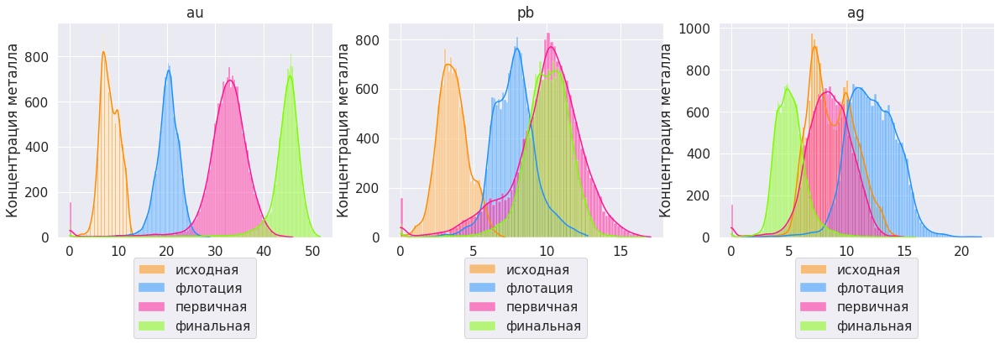

In [24]:
Dens = plt.figure(figsize=(20,16))
j=1
for i in range(0,3):
    ax = Dens.add_subplot(3,3,j)
    j+=1
    ax.set_title(metals[i])
    ax.set(xlabel=' ', ylabel = 'Концентрация металла')
    sns.histplot(data_full[stage[0]+metals[i]], kde=True, color='darkorange', label='исходная')
    sns.histplot(data_full[stage[1]+metals[i]], kde=True, color='dodgerblue', label='флотация')
    sns.histplot(data_full[stage[2]+metals[i]], kde=True, color='deeppink', label='первичная')
    sns.histplot(data_full[stage[3]+metals[i]], kde=True, color='lawngreen', label='финальная')
    plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5))

- Концентрация золота увеличивается от исходного сырья до финальной отчистки
- Концентрация серебра увеличивается после флотации, а потом понижается от этапа к этапу
- Концентраци свинца увеличивается после первичной отчистки и немного снижается к финальной

Остались аномалии около нуля. Удалим их тоже.

In [25]:
for i in metals:
    data_train = data_train[data_train['primary_cleaner.output.concentrate_'+i] >= 1]
    data_full = data_full[data_full['primary_cleaner.output.concentrate_'+i] >= 1]

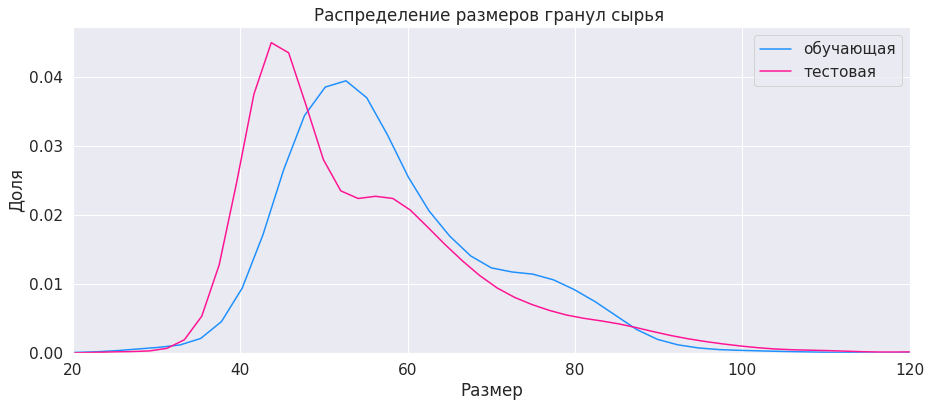

In [26]:
plt.figure(figsize=(15,6))
fig = sns.kdeplot(data=data_train, x='rougher.input.feed_size', color='dodgerblue', label='обучающая')
sns.kdeplot(data=data_test, x='rougher.input.feed_size', color='deeppink', label='тестовая')
fig.set_title('Распределение размеров гранул сырья ')
fig.set(xlabel='Размер', ylabel = 'Доля')
plt.legend()
fig.set_xlim(20, 120);

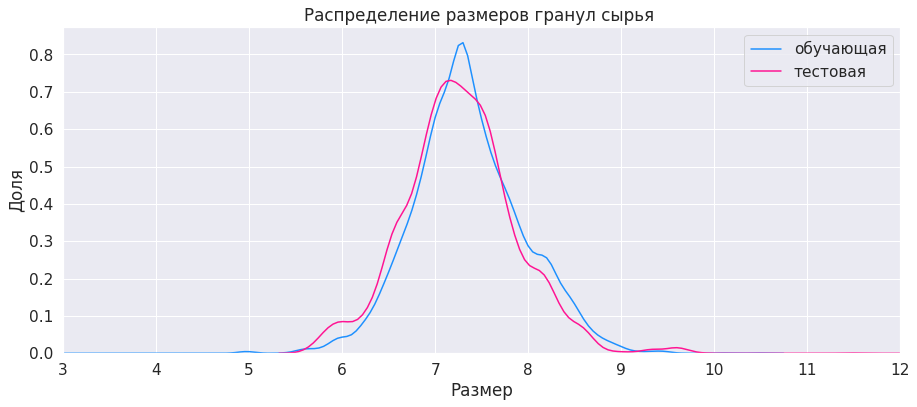

In [27]:
plt.figure(figsize=(15,6))
fig = sns.kdeplot(data=data_train, x='primary_cleaner.input.feed_size', color='dodgerblue', label='обучающая')
sns.kdeplot(data=data_test, x='primary_cleaner.input.feed_size', color='deeppink', label='тестовая')
fig.set_title('Распределение размеров гранул сырья ')
fig.set(xlabel='Размер', ylabel = 'Доля')
plt.legend()
fig.set_xlim(3, 12);

Размер гранул сырья уменьшился почти в десять раз, однако распределения стали более похожи, значит оценка моделей будет более точная.

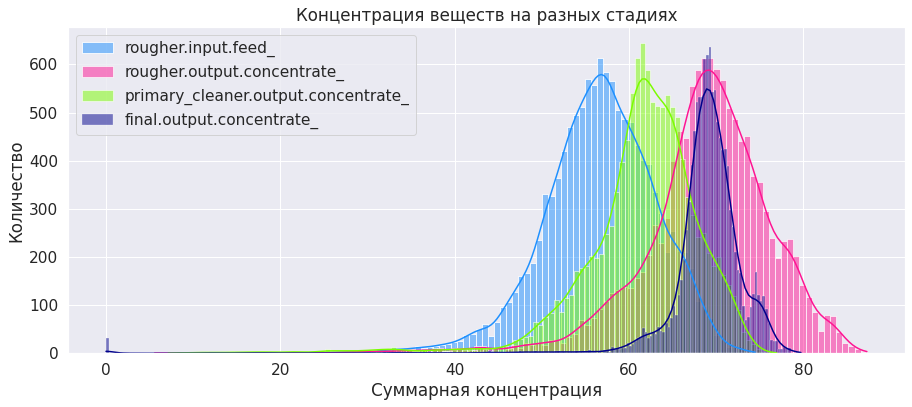

In [28]:
plt.figure(figsize=(15,6))
for i in range(len(stage)):
    summ=0
    for j in metals:
        summ += data_train[stage[i]+j]
    ax=sns.histplot(data=summ, kde=True, color=colors[i], label=stage[i])
    ax.set_title('Концентрация веществ на разных стадиях')
    ax.set(xlabel='Суммарная концентрация', ylabel = 'Количество')
plt.legend();

Суммарная концентрация уменьшается после первичной отчистки, но увеличивается после финальной.

## Модель

In [29]:
def smape(y_true, y_pred):
    sm = abs(y_true-y_pred)/((abs(y_true)+abs(y_pred))/200)
    return np.mean(sm)

In [30]:
def final_smape(smape_rougher, smape_final):
    return 0.25*smape_rougher+0.75*smape_final

In [31]:
data_train.drop(set(data_train.columns)-set(data_test.columns),axis=1, inplace=True)

Уберем из обучающей выборки столбцы, котороые отсутствуют в тестовой.

In [32]:
X_train = data_train.drop(['date','rougher.output.recovery', 'final.output.recovery'], axis=1)
X_test = data_test.drop(['date','rougher.output.recovery', 'final.output.recovery'], axis=1)
y_train_r = data_train['rougher.output.recovery']
y_train_f = data_train['final.output.recovery']
y_test_r = data_test['rougher.output.recovery']
y_test_f = data_test['final.output.recovery']

In [33]:
models = {
    "RandomForest" : RandomForestRegressor(random_state=0),
    "LGBM" : LGBMRegressor(random_state=0),
    'DecisionTree': DecisionTreeRegressor(random_state=0),
    'Ridge': Ridge(random_state=0),
    'Lasso': Lasso(random_state=0),
    'ElasticNet': ElasticNet(random_state=0)
}
LR_grid = {}

Lasso_grid = {'model__alpha':[0.02, 0.024, 0.026, 0.03]}
Ridge_grid = {'model__alpha':[200, 230, 250, 270, 290, 300]}
El_grid = {"model__max_iter": [1, 5, 10],
                      "model__alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                      "model__l1_ratio": np.arange(0.0, 1.0, 0.1)}

DT_grid = {'model__max_depth': [4, 6, 8, 10],
            'model__min_samples_leaf': [1, 3, 5, 8]}

RF_grid = {'model__n_estimators': [5, 10, 15],
        'model__max_depth': [4, 6, 8, 10]}

boost_grid = {'model__n_estimators': [50, 100, 150, 200],
        'model__max_depth': [4, 8, 12],
        'model__learning_rate': [0.05, 0.1, 0.15]}

grid = {
    "RandomForest" : RF_grid,
    "LGBM" : boost_grid,
    "DecisionTree" : DT_grid,
    'Ridge': Ridge_grid,
    'Lasso': Lasso_grid,
    'ElasticNet': El_grid
}
scorer = make_scorer(smape, greater_is_better=False)
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

In [34]:
def pipeline(X_train, y_train):
    i=0
    clf_best_params=models.copy()
    valid_scores=pd.DataFrame({'Model':models.keys(), 'Smape': np.zeros(len(models)), 'Training time': np.zeros(len(models))})
    for key, model in models.items():
        pipeline = Pipeline([( "scaler" , StandardScaler()),('model', model)])
        clf = RandomizedSearchCV(estimator=pipeline, param_distributions=grid[key], n_jobs=-1, cv=5, scoring=scorer)
        start = time.time()

        clf.fit(X_train, y_train)
        valid_scores.iloc[i,1]=clf.best_score_

        clf_best_params[key]=clf.best_params_

        stop = time.time()
        valid_scores.iloc[i,2]=np.round((stop - start)/60, 2)

        print('Model:', key)
        print('Training time (mins):', valid_scores.iloc[i,2])
        print('')
        i+=1
    return valid_scores, clf_best_params 

In [ ]:
valid_scores_r, clf_best_params_r = pipeline(X_train, y_train_r)

In [36]:
print(clf_best_params_r)
valid_scores_r

{'RandomForest': {'model__n_estimators': 15, 'model__max_depth': 6}, 'LGBM': {'model__n_estimators': 50, 'model__max_depth': 4, 'model__learning_rate': 0.1}, 'DecisionTree': {'model__min_samples_leaf': 1, 'model__max_depth': 4}, 'Ridge': {'model__alpha': 300}, 'Lasso': {'model__alpha': 0.03}, 'ElasticNet': {'model__max_iter': 1, 'model__l1_ratio': 0.30000000000000004, 'model__alpha': 1}}


,Model,Smape,Training time
0,RandomForest,-5.926231,1.58
1,LGBM,-5.282871,1.87
2,DecisionTree,-6.327409,0.25
3,Ridge,-6.336479,0.10
4,Lasso,-6.458117,0.35
5,ElasticNet,-6.055136,0.21


In [ ]:
valid_scores_f, clf_best_params_f = pipeline(X_train, y_train_f)

In [38]:
print(clf_best_params_f)
valid_scores_f

{'RandomForest': {'model__n_estimators': 10, 'model__max_depth': 4}, 'LGBM': {'model__n_estimators': 100, 'model__max_depth': 12, 'model__learning_rate': 0.05}, 'DecisionTree': {'model__min_samples_leaf': 3, 'model__max_depth': 4}, 'Ridge': {'model__alpha': 300}, 'Lasso': {'model__alpha': 0.03}, 'ElasticNet': {'model__max_iter': 10, 'model__l1_ratio': 0.30000000000000004, 'model__alpha': 1}}


,Model,Smape,Training time
0,RandomForest,-8.923347,1.55
1,LGBM,-9.041504,7.12
2,DecisionTree,-9.780081,0.24
3,Ridge,-10.543222,0.10
4,Lasso,-10.540958,0.17
5,ElasticNet,-9.133771,0.23


In [39]:
final_smape(valid_scores_r['Smape'], valid_scores_f['Smape'])

0   -8.174068
1   -8.101846
2   -8.916913
3   -9.491536
4   -9.520248
5   -8.364113
Name: Smape, dtype: float64

Наилучшее качество на кросс-валидации показывает модель LGBM.

### Финальная модель

In [40]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [41]:
clf_r = LGBMRegressor(n_estimators=100, max_depth=4, learning_rate=0.05, random_state=0)
clf_f = LGBMRegressor(n_estimators=50, max_depth=4, learning_rate=0.15, random_state=0)
clf_r.fit(X_train, y_train_r)
clf_f.fit(X_train, y_train_f)
y_pred_r = clf_r.predict(X_test)
y_pred_f = clf_f.predict(X_test)

In [42]:
print('Smape:', final_smape(smape(y_test_r, y_pred_r), smape(y_test_f, y_pred_f)))

Smape: 8.971943870324143


In [43]:
clf_r = DummyRegressor(strategy="mean")
clf_f = DummyRegressor(strategy="mean")
clf_r.fit(X_train, y_train_r)
clf_f.fit(X_train, y_train_f)
y_pred_r = clf_r.predict(X_test)
y_pred_f = clf_f.predict(X_test)

In [44]:
print('Smape:', final_smape(smape(y_test_r, y_pred_r), smape(y_test_f, y_pred_f)))

Smape: 9.635957342991897


Построенная модель показывает качество лучше константной.

## Вывод

В проекте стояла задача по поиску оптимальной модели для предсказания коэффициента восстановления золота из золотосодержащей руды. При анализе данных были выявлены некоторые аномалии и выбросы в данных. Например большое количество нулевых значений на некотрых этапах обработки сырья. Такие выбросы возможно связаны со сбоями в оборудовании. Так же стоит отметить отсутствие некоторых показателей в тестовой выборке.Остутвовали целевые признаки и расчетные характеристики и отсутвуют они скорее всего из-за того, что они расчитываются после завершения процесса. Изучены изменения в концентрациях металоов на разных этапах обработки сырья, для того чтобы отследить насколько чистый продукт получается после обработки. Так: 
- Концентрация золота увеличивается от исходного сырья до финальной отчистки
- Концентрация серебра увеличивается после флотации, а потом понижается от этапа к этапу
- Концентраци свинца увеличивается после первичной отчистки и немного снижается к финальной

Далее исследованы некоторые модели машинного обучения. По рассчету финальной оценки Smape, выбрана модель LGBM. Качество данной модели выше константной, а значит ее можно использовать для оптимизации производства. 